# General training and interpretability pipeline

In this notebook, we analyze the immune dataset of 9 batches from four human peripheral blood and bone marrow studies, with 16 annotated cell types. We apply DRVI with 128 latent dimensions to showcase the following:

- How to train DRVI
- Observe vanished dimensions
- Observe the latent space in UMAP and heatmap
- How to run the interpretability pipeline
- How to identify and check individual dimensions

## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import warnings

In [2]:
warnings.filterwarnings("ignore")

In [3]:
import anndata as ad
import scanpy as sc
from matplotlib import pyplot as plt
from IPython.display import display
from gprofiler import GProfiler

import drvi
from drvi.model import DRVI
from drvi.utils.misc import hvg_batch

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/merlin/dtypes/mappings/tf.py:52: UserWarning: Tensorflow dtype mappings did not

In [4]:
sc.settings.set_figure_params(dpi=100, frameon=False)
sc.set_figure_params(dpi=100)
sc.set_figure_params(figsize=(3, 3))
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (3, 3)

## Load Data

In [5]:
%%bash

# Download Immune dataset

mkdir -p tmp

# Check if the file exists
if [ ! -f tmp/immune_all.h5ad ]; then
  # Download the file if it does not exist
  { # try
      wget -O tmp/immune_all.h5ad https://figshare.com/ndownloader/files/25717328
      #save your output
  } || \
  { # catch
      curl -L https://figshare.com/ndownloader/files/25717328 -o tmp/immune_all.h5ad
  }
  echo "File downloaded successfully."
else
  echo "File already exists."
fi

File already exists.


In [6]:
adata = sc.read("tmp/immune_all.h5ad")
# Remove dataset with non-count values
adata = adata[adata.obs["batch"] != "Villani"].copy()
adata

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

## Pre-processing

In [7]:
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p'
    layers: 'counts'

In [8]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [9]:
# Batch aware HVG selection (method is obtained from scIB metrics)
hvg_genes = hvg_batch(adata, batch_key="batch", target_genes=2000, adataOut=False)
adata = adata[:, hvg_genes].copy()
adata

This function is obtained from scIB metrics. Please don't forget to cite them if you use it.
Using 311 HVGs from full intersect set
Using 144 HVGs from n_batch-1 set
Using 176 HVGs from n_batch-2 set
Using 227 HVGs from n_batch-3 set
Using 305 HVGs from n_batch-4 set
Using 506 HVGs from n_batch-5 set
Using 331 HVGs from n_batch-6 set
Using 2000 HVGs


AnnData object with n_obs × n_vars = 32484 × 2000
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


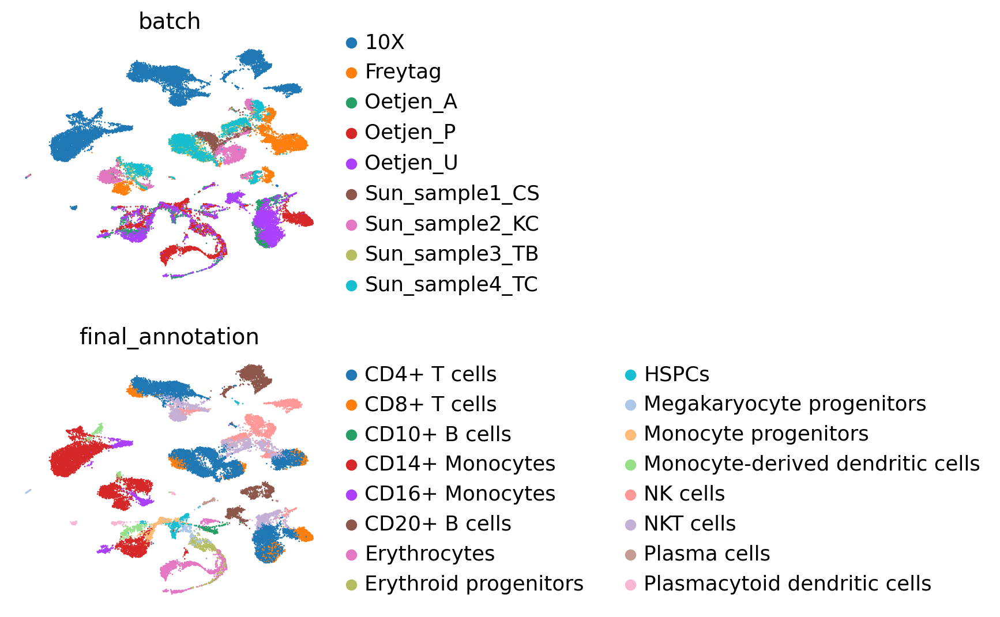

In [10]:
sc.pl.umap(adata, color=["batch", "final_annotation"], ncols=1, frameon=False)

## Train DRVI

In [13]:
# Setup data
DRVI.setup_anndata(
    adata,
    # DRVI accepts count data by default.
    # Do not forget to change gene_likelihood if you provide a non-count data.
    layer="counts",
    # Always provide a list. DRVI can accept multiple covariates.
    categorical_covariate_keys=["batch"],
    # DRVI accepts count data by default.
    # Set to false if you provide log-normalized data and use normal distribution (mse loss).
    is_count_data=True,
)

# construct the model
model = DRVI(
    adata,
    n_latent=128,
    # For encoder and decoder dims, provide a list of integers.
    encoder_dims=[128, 128],
    decoder_dims=[128, 128],
)
model

INFO     drvi: The model has been initialized                                                                      


DRVI 
Covariates: ['batch'], 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb_softmax, 

Training status: Not Trained
Model's adata is minified?: False

In [14]:
# For cpu training you should add the following line to the model.train parameters:
# accelerator="cpu", devices=1,
#
# For mps acceleration on macbooks, add the following line to the model.train parameters:
# accelerator="mps", devices=1,
#
# For gpu training don't provide any additional parameter.
# More details here: https://lightning.ai/docs/pytorch/stable/accelerators/gpu_basic.html

n_epochs = 400

# train the model
model.train(
    max_epochs=n_epochs,
    early_stopping=False,
    early_stopping_patience=20,
    # mps
    # accelerator="mps", devices=1,
    # cpu
    # accelerator="cpu", devices=1,
    # gpu: no additional parameter
    #
    # No need to provide `plan_kwargs` if n_epochs >= 400.
    plan_kwargs={
        "n_epochs_kl_warmup": n_epochs,
    },
)

# Runtime:
# The runtime for CPU laptop (M1) is 208 minutes
# The runtime for Macbook gpu (M1) is 64 minutes
# The runtime for GPU (A100) is 17 minutes

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1/400:   0%|                                                                                                                                                            | 0/400 [00:00<?, ?it/s]

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 400/400: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [17:49<00:00,  2.67s/it, v_num=1, train_loss_step=786, train_loss_epoch=744]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [17:49<00:00,  2.67s/it, v_num=1, train_loss_step=786, train_loss_epoch=744]


In [15]:
# Save the model
model.save("tmp/drvi_general_pipeline_immune_128", overwrite=True)

## Latent space

In [11]:
# Load the model
model = DRVI.load("tmp/drvi_general_pipeline_immune_128", adata)

INFO     File tmp/drvi_general_pipeline_immune_128/model.pt already downloaded                                     


/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
CUDA backend failed to initialize: Found CUDA version 12010, but JAX was built against version 12020, which is newer. The copy of CUDA that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


INFO     drvi: The model has been initialized                                                                      


In [12]:
embed = ad.AnnData(model.get_latent_representation(), obs=adata.obs)
sc.pp.subsample(embed, fraction=1.0)  # Shuffling for better visualization of overlapping colors

sc.pp.neighbors(embed, n_neighbors=10, use_rep="X", n_pcs=embed.X.shape[1])
sc.tl.umap(embed, spread=1.0, min_dist=0.5, random_state=123)
sc.pp.pca(embed)

embed.write("tmp/drvi_general_pipeline_immune_128_embed.h5ad")

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


In [34]:
embed = sc.read("tmp/drvi_general_pipeline_immune_128_embed.h5ad")

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


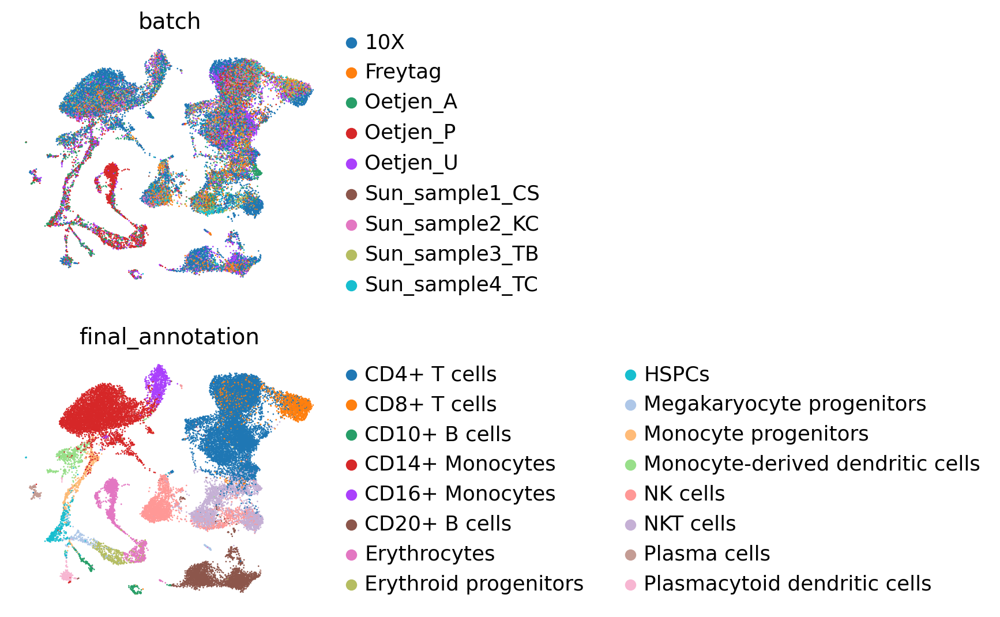

In [13]:
sc.pl.umap(embed, color=["batch", "final_annotation"], ncols=1, frameon=False)

### Chack latent dimension stats

In [14]:
drvi.utils.tl.set_latent_dimension_stats(model, embed)
embed.var.sort_values("reconstruction_effect", ascending=False)[:5]

,original_dim_id,reconstruction_effect,order,max_value,mean,min,max,std,title,vanished
46,46,931.187500,0,2.352121,0.147811,-1.912188,2.352121,0.469992,DR 1,False
120,120,436.232178,1,3.625910,0.015168,-1.838342,3.625910,0.580875,DR 2,False
127,127,193.503403,2,3.484604,-0.022672,-1.629448,3.484604,0.618393,DR 3,False
30,30,185.024261,3,3.583931,0.059325,-2.034181,3.583931,0.514619,DR 4,False
42,42,178.514847,4,4.169917,-0.022927,-1.293545,4.169917,0.601911,DR 5,False


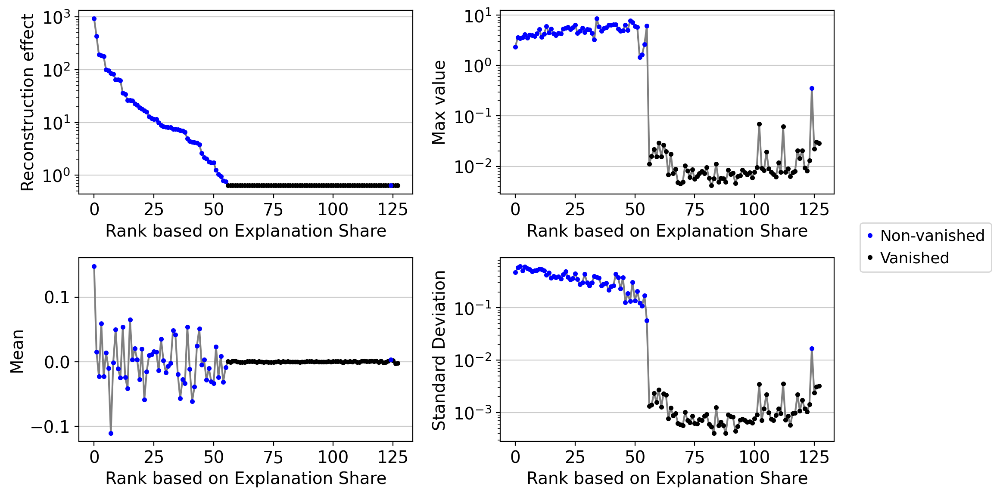

In [15]:
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2)

You can check the same plot after removing vanished dimensions

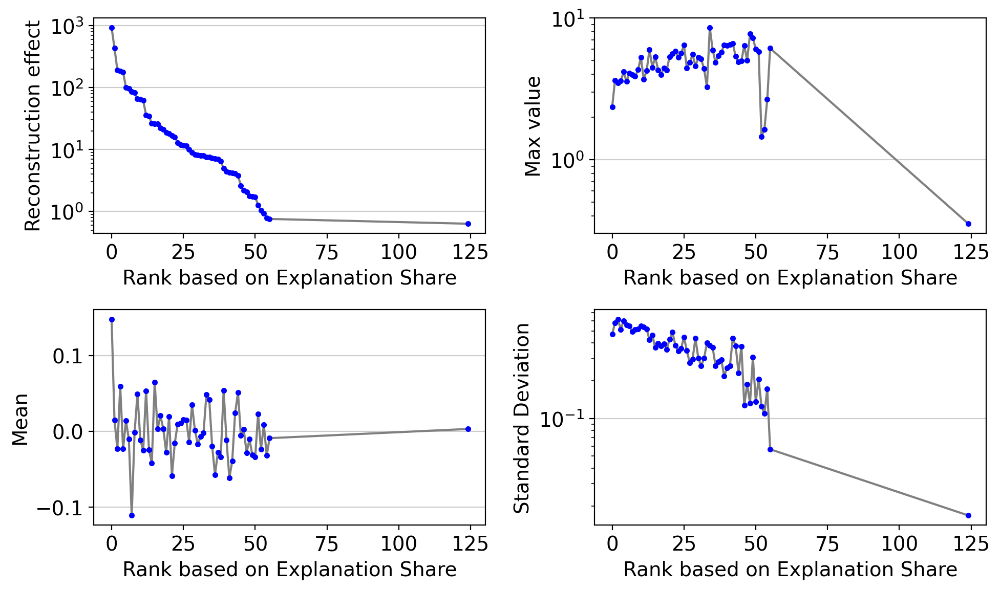

In [16]:
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, remove_vanished=True)

### Plot latent dimensions

By default, vanished dimensions are not plotted. Change arguments if you would like to.

#### UMAP

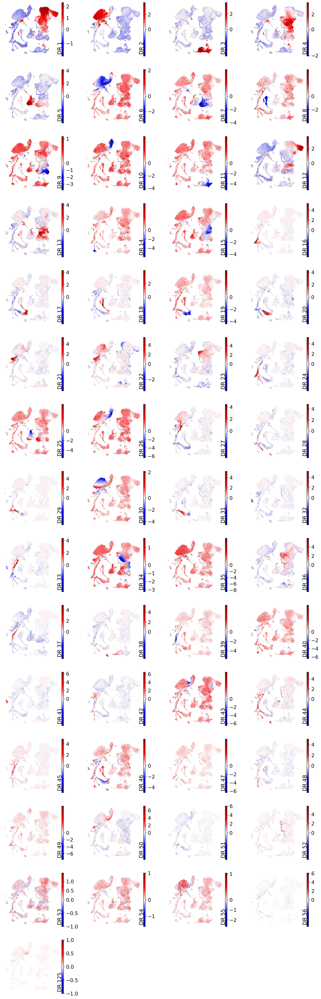

In [17]:
drvi.utils.pl.plot_latent_dims_in_umap(embed)

#### Heatmap

Heatmaps can be useful to visualize general relationship between latent dims and known categories of data

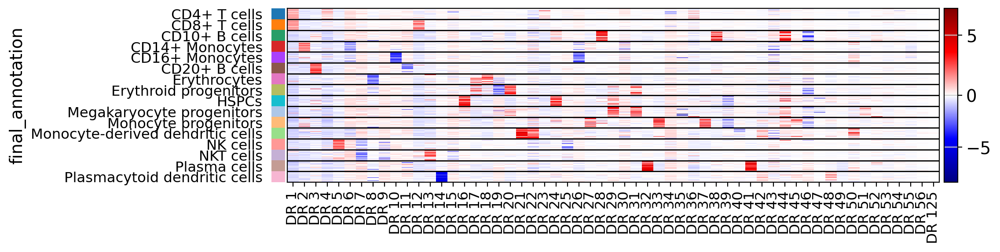

In [18]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "final_annotation", title_col="title")

It is possible to sort dimensions based on the top relevance with respect to a categoricals variable

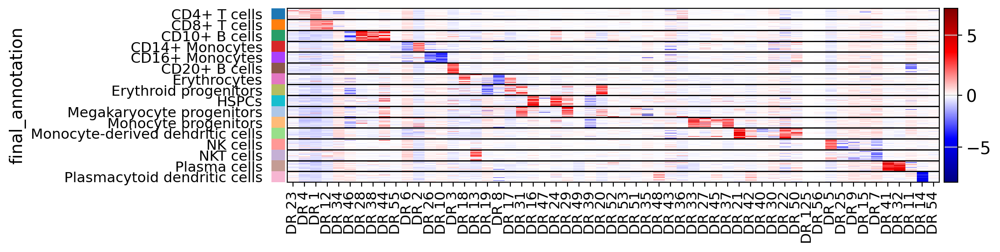

In [19]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "final_annotation", title_col="title", sort_by_categorical=True)

## Interpretability

### Traversing the latent space

Here we use DRVI's utils to traverse latent space and find the effect of each latent dimension

In [26]:
traverse_adata = drvi.utils.tl.traverse_latent(model, embed, n_samples=20, max_noise_std=0.0)
drvi.utils.tl.calculate_differential_vars(traverse_adata)
traverse_adata.write("tmp/drvi_general_pipeline_immune_128_traverse_adata.h5ad")

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


traversing latent ...
Input latent shape: control: (51200, 128), effect: (51200, 128)
Output mean param shape: control: (51200, 2000), effect: (51200, 2000)
Finding differential variables per latent dimension ...


In [27]:
traverse_adata = sc.read("tmp/drvi_general_pipeline_immune_128_traverse_adata.h5ad")
traverse_adata

/home/icb/amirali.moinfar/miniconda3/envs/drvi/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 51200 × 2000
    obs: 'original_order', 'dim_id', 'sample_id', 'step_id', 'span_value', 'lib_size', 'title', 'vanished', 'order'
    var: 'original_order'
    uns: 'combined_score_traverse_effect_neg_dim_ids', 'combined_score_traverse_effect_pos_dim_ids', 'combined_score_traverse_effect_stepwise', 'max_possible_traverse_effect_neg_dim_ids', 'max_possible_traverse_effect_pos_dim_ids', 'max_possible_traverse_effect_stepwise', 'min_possible_traverse_effect_neg_dim_ids', 'min_possible_traverse_effect_pos_dim_ids', 'min_possible_traverse_effect_stepwise'
    obsm: 'cat_covs', 'control_latent', 'effect_latent'
    varm: 'combined_score_traverse_effect_neg', 'combined_score_traverse_effect_pos', 'max_possible_traverse_effect_neg', 'max_possible_traverse_effect_pos', 'min_possible_traverse_effect_neg', 'min_possible_traverse_effect_pos'
    layers: 'control', 'effect'

### Getting the results

We can then visualize the top relevant genes for each dimension

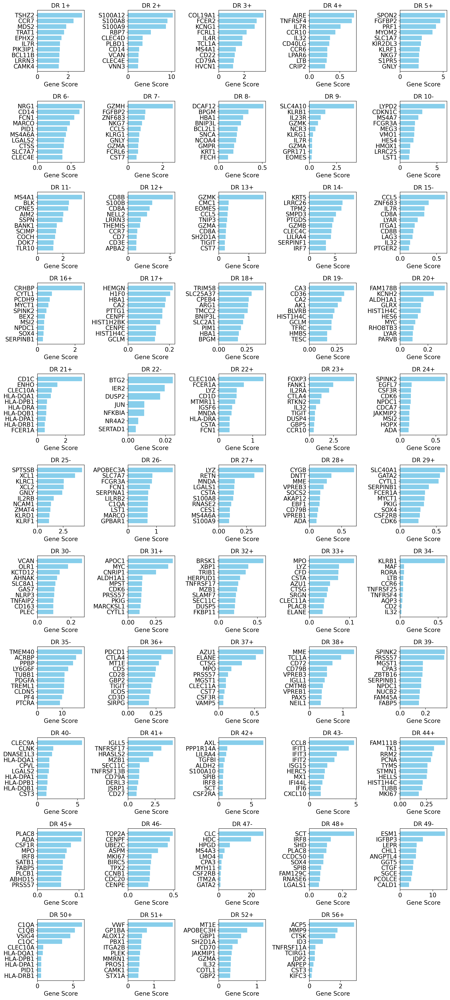

In [28]:
drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0)

### Identify using external tools

Additionally any gene set enrichment tool / marker gene searching tools can be used to identify the meaning of dimensions

In [31]:
gp = GProfiler(return_dataframe=True)
dimensions_interpretability = drvi.utils.tools.iterate_on_top_differential_vars(
    traverse_adata, key="combined_score", score_threshold=0.0
)

# For making it brief we just iterate over 5 dimensions
for dim_title, gene_scores in dimensions_interpretability[:5]:
    print(dim_title)

    gene_scores = gene_scores[gene_scores > gene_scores.max() / 10]
    print(gene_scores)

    relevant_genes = gene_scores.index.to_list()[:100]

    relevant_pathways = gp.profile(
        organism="hsapiens", query=relevant_genes, background=list(adata.var.index), domain_scope="custom"
    )
    display(relevant_pathways[:10])

DR 1+
index
TSHZ2     2.908337
CCR7      2.346761
MDS2      1.871415
TRAT1     1.738709
EPHX2     1.568059
            ...   
STK17A    0.304105
CISH      0.296865
BACH2     0.296194
UPP1      0.293498
EVI2A     0.290966
Name: 46, Length: 135, dtype: float64


,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,HP,HP:0025540,Abnormal T cell subset distribution,0.000247,True,Any abnormality in the proportion T cells subs...,30,99,12,1987,0.121212,0.400000,query_1,[HP:0011839]
1,WP,WP:WP5072,Modulators of TCR signaling and T cell activation,0.000907,True,Modulators of TCR signaling and T cell activation,27,99,11,1987,0.111111,0.407407,query_1,[WP:000000]
2,GO:BP,GO:0042110,T cell activation,0.002489,True,"""The change in morphology and behavior of a ma...",217,99,30,1987,0.303030,0.138249,query_1,[GO:0046649]
3,HP,HP:0011839,Abnormal T cell count,0.002808,True,A deviation from the normal count of T cells.,43,99,13,1987,0.131313,0.302326,query_1,"[HP:0002843, HP:0040088]"
4,GO:BP,GO:0031295,T cell costimulation,0.008200,True,"""The process of providing, via surface-bound r...",26,99,10,1987,0.101010,0.384615,query_1,"[GO:0031294, GO:0050870]"
5,HP,HP:0002843,Abnormal T cell morphology,0.009144,True,An abnormality of T cells.,47,99,13,1987,0.131313,0.276596,query_1,[HP:0004332]
6,GO:BP,GO:0045785,positive regulation of cell adhesion,0.011514,True,"""Any process that activates or increases the f...",157,99,24,1987,0.242424,0.152866,query_1,"[GO:0007155, GO:0030155, GO:0048522]"
7,GO:BP,GO:0031294,lymphocyte costimulation,0.012490,True,"""The process of providing, via surface-bound r...",27,99,10,1987,0.101010,0.370370,query_1,"[GO:0002376, GO:0051251]"
8,GO:BP,GO:1903039,positive regulation of leukocyte cell-cell adh...,0.019340,True,"""Any process that activates or increases the f...",116,99,20,1987,0.202020,0.172414,query_1,"[GO:0007159, GO:0022409, GO:1903037]"
9,GO:CC,GO:0042101,T cell receptor complex,0.019955,True,"""A protein complex that contains a disulfide-l...",12,99,7,1987,0.070707,0.583333,query_1,[GO:0098802]


DR 2+
index
S100A12     10.286894
S100A8       9.074029
S100A9       8.713352
RBP7         5.257724
CLEC4D       3.346774
PLBD1        3.305976
CD14         2.552208
VCAN         2.415323
CLEC4E       2.387568
VNN3         2.316929
CDA          2.159050
SERPINB2     2.083218
FCN1         1.958485
CRISPLD2     1.941017
MNDA         1.888873
DYSF         1.766872
FPR2         1.746928
STEAP4       1.713762
FPR1         1.677726
MEGF9        1.673008
F5           1.658120
WLS          1.549165
QPCT         1.543528
AQP9         1.365933
CYP4F3       1.357299
CSTA         1.356638
LRRK2        1.339109
LYZ          1.241825
CD93         1.223080
MARC1        1.219439
VNN2         1.219149
S100P        1.185663
CYBB         1.171445
BST1         1.149443
CYP1B1       1.109260
ITGAM        1.094254
PADI4        1.094138
C5AR1        1.090423
HP           1.062052
CKAP4        1.045191
Name: 120, dtype: float64


,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,REAC,REAC:R-HSA-6798695,Neutrophil degranulation,2.188522e-09,True,Neutrophil degranulation,164,38,21,1987,0.552632,0.128049,query_1,[REAC:R-HSA-168249]
1,GO:CC,GO:0099503,secretory vesicle,1.767539e-08,True,"""A cytoplasmic, membrane bound vesicle that is...",258,38,24,1987,0.631579,0.093023,query_1,[GO:0031410]
2,GO:CC,GO:0030141,secretory granule,1.822928e-07,True,"""A small subcellular vesicle, surrounded by a ...",229,38,22,1987,0.578947,0.096070,query_1,"[GO:0012505, GO:0099503]"
3,REAC,REAC:R-HSA-168249,Innate Immune System,7.585021e-06,True,Innate Immune System,274,38,22,1987,0.578947,0.080292,query_1,[REAC:R-HSA-168256]
4,GO:CC,GO:0031410,cytoplasmic vesicle,6.019583e-05,True,"""A vesicle found in the cytoplasm of a cell."" ...",485,38,27,1987,0.710526,0.055670,query_1,"[GO:0005737, GO:0097708]"
5,GO:CC,GO:0097708,intracellular vesicle,6.329387e-05,True,"""Any vesicle that is part of the intracellular...",486,38,27,1987,0.710526,0.055556,query_1,"[GO:0031982, GO:0043231]"
6,GO:CC,GO:0034774,secretory granule lumen,2.093595e-03,True,"""The volume enclosed by the membrane of a secr...",91,38,12,1987,0.315789,0.131868,query_1,"[GO:0030141, GO:0060205]"
7,GO:CC,GO:0031983,vesicle lumen,2.695428e-03,True,"""The volume enclosed by the membrane or protei...",93,38,12,1987,0.315789,0.129032,query_1,"[GO:0031982, GO:0043233]"
8,GO:CC,GO:0060205,cytoplasmic vesicle lumen,2.695428e-03,True,"""The volume enclosed by a cytoplasmic vesicle....",93,38,12,1987,0.315789,0.129032,query_1,"[GO:0031410, GO:0031983, GO:0070013]"
9,GO:CC,GO:0042581,specific granule,3.028658e-03,True,"""Granule with a membranous, tubular internal s...",59,38,10,1987,0.263158,0.169492,query_1,[GO:0030141]


DR 3+
index
COL19A1     3.509694
FCER2       2.980789
KCNG1       2.828026
FCRL1       2.194861
IL4R        1.870011
TCL1A       1.835685
MS4A1       1.339168
CD22        1.255003
CD79A       1.189130
HVCN1       1.125268
MACROD2     1.068025
CXCR5       0.930591
HLA-DOB     0.924546
CD79B       0.842762
ABCB4       0.788650
BANK1       0.757270
SCN3A       0.744153
CD200       0.719183
CNR2        0.712453
CD72        0.710629
SLC38A11    0.694602
RALGPS2     0.682543
FCRLA       0.648411
ADAM28      0.643039
CD19        0.642893
FCRL2       0.567427
FAM129C     0.566015
MARCH1      0.556092
FAM177B     0.526788
P2RX5       0.517794
MEF2C       0.507205
PAX5        0.502446
VPREB3      0.483223
MYO7B       0.468210
BLK         0.462798
SWAP70      0.462452
BIRC3       0.454185
STAG3       0.453479
HLA-DMB     0.434268
CD74        0.412622
PCDH9       0.408344
HLA-DRA     0.404929
HLA-DQB1    0.404306
NEIL1       0.392693
FCRL3       0.391047
ARHGAP24    0.383755
CD40        0.381567
G

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,HPA,HPA:0530722,spleen; cells in white pulp[≥Medium],0.000370,True,spleen; cells in white pulp[≥Medium],361,47,26,1987,0.553191,0.072022,query_1,[HPA:0530721]
1,HPA,HPA:0030442,appendix; non-germinal center cells[≥Medium],0.000391,True,appendix; non-germinal center cells[≥Medium],77,47,13,1987,0.276596,0.168831,query_1,[HPA:0030441]
2,HPA,HPA:0030432,appendix; germinal center cells[≥Medium],0.000565,True,appendix; germinal center cells[≥Medium],52,47,11,1987,0.234043,0.211538,query_1,[HPA:0030431]
3,HPA,HPA:0030441,appendix; non-germinal center cells[≥Low],0.000773,True,appendix; non-germinal center cells[≥Low],97,47,14,1987,0.297872,0.144330,query_1,[HPA:0030000]
4,HPA,HPA:0310433,lymph node; germinal center cells[High],0.000847,True,lymph node; germinal center cells[High],133,47,16,1987,0.340426,0.120301,query_1,[HPA:0310432]
5,HPA,HPA:0030443,appendix; non-germinal center cells[High],0.001466,True,appendix; non-germinal center cells[High],24,47,8,1987,0.170213,0.333333,query_1,[HPA:0030442]
6,GO:BP,GO:0042113,B cell activation,0.001960,True,"""The change in morphology and behavior of a ma...",104,47,14,1987,0.297872,0.134615,query_1,[GO:0046649]
7,HPA,HPA:0131332,colon; mucosal lymphoid cells[≥Medium],0.004623,True,colon; mucosal lymphoid cells[≥Medium],111,47,14,1987,0.297872,0.126126,query_1,[HPA:0131331]
8,GO:BP,GO:0050853,B cell receptor signaling pathway,0.005116,True,"""The series of molecular signals initiated by ...",38,47,9,1987,0.191489,0.236842,query_1,[GO:0050851]
9,HPA,HPA:0030431,appendix; germinal center cells[≥Low],0.009298,True,appendix; germinal center cells[≥Low],67,47,11,1987,0.234043,0.164179,query_1,[HPA:0030000]


DR 4+
index
AIRE       0.734177
TNFRSF4    0.697001
IL7R       0.510808
CCR10      0.427591
IL32       0.339175
             ...   
CAMK4      0.075522
NPDC1      0.075383
CDC25B     0.074881
FAM129A    0.074520
ZAP70      0.073909
Name: 30, Length: 107, dtype: float64


,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:BP,GO:0033077,T cell differentiation in thymus,0.002786,True,"""The process in which a precursor cell type ac...",36,99,12,1987,0.121212,0.333333,query_1,[GO:0030217]
1,HP,HP:0025540,Abnormal T cell subset distribution,0.003354,True,Any abnormality in the proportion T cells subs...,30,99,11,1987,0.111111,0.366667,query_1,[HP:0011839]
2,HP,HP:0009098,Chronic oral candidiasis,0.006922,True,Chronic accumulation and overgrowth of the fun...,15,99,8,1987,0.080808,0.533333,query_1,[HP:0002728]
3,HPA,HPA:0471471,skin 2; lymphocytes[≥Low],0.009484,True,skin 2; lymphocytes[≥Low],144,99,23,1987,0.232323,0.159722,query_1,[HPA:0470000]
4,GO:BP,GO:0042110,T cell activation,0.009818,True,"""The change in morphology and behavior of a ma...",217,99,29,1987,0.292929,0.133641,query_1,[GO:0046649]
5,HP,HP:0002728,Chronic mucocutaneous candidiasis,0.011788,True,Recurrent or persistent superficial Candida in...,21,99,9,1987,0.090909,0.428571,query_1,[HP:0011370]
6,HPA,HPA:0461471,skin 1; lymphocytes[≥Low],0.012870,True,skin 1; lymphocytes[≥Low],124,99,21,1987,0.212121,0.169355,query_1,[HPA:0460000]
7,GO:BP,GO:0030217,T cell differentiation,0.017128,True,"""The process in which a precursor cell type ac...",126,99,21,1987,0.212121,0.166667,query_1,"[GO:0030098, GO:0042110]"
8,HP,HP:0011370,Recurrent cutaneous fungal infections,0.019133,True,Increased susceptibility to cutaneous fungal i...,22,99,9,1987,0.090909,0.409091,query_1,"[HP:0001581, HP:0002841]"
9,HP,HP:0005403,T lymphocytopenia,0.046257,True,An abnormally low count of T cells.,24,99,9,1987,0.090909,0.375000,query_1,"[HP:0001888, HP:0011839]"


DR 5+
index
SPON2     5.179609
FGFBP2    4.658262
PRF1      4.165530
MYOM2     3.751756
SLC1A7    2.527004
            ...   
KRT86     0.564495
ASCL2     0.556340
CEP78     0.546012
CCL5      0.521879
CD7       0.519456
Name: 42, Length: 65, dtype: float64


,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:BP,GO:0001906,cell killing,0.000453,True,"""Any process in an organism that results in th...",78,65,15,1987,0.230769,0.192308,query_1,[GO:0009987]
1,GO:BP,GO:0002228,natural killer cell mediated immunity,0.000896,True,"""The promotion of an immune response by natura...",31,65,10,1987,0.153846,0.322581,query_1,"[GO:0002449, GO:0045087]"
2,KEGG,KEGG:04650,Natural killer cell mediated cytotoxicity,0.003187,True,Natural killer cell mediated cytotoxicity,44,65,11,1987,0.169231,0.250000,query_1,[KEGG:00000]
3,GO:BP,GO:0042267,natural killer cell mediated cytotoxicity,0.005170,True,"""The directed killing of a target cell by a na...",28,65,9,1987,0.138462,0.321429,query_1,"[GO:0001909, GO:0002228]"
4,GO:BP,GO:0001909,leukocyte mediated cytotoxicity,0.005976,True,"""The directed killing of a target cell by a le...",57,65,12,1987,0.184615,0.210526,query_1,"[GO:0001906, GO:0002443]"
5,WP,WP:WP5092,Interactions of natural killer cells in pancre...,0.021749,True,Interactions of natural killer cells in pancre...,17,65,7,1987,0.107692,0.411765,query_1,[WP:000000]


### Looking into individual dimensions

A user can take a deeper look into individual dimensions. we can see the min_possible, and max_possible log-fold-changes of each dimension. In addition, one can check the activity of top relevant genes for dimensions of interest.

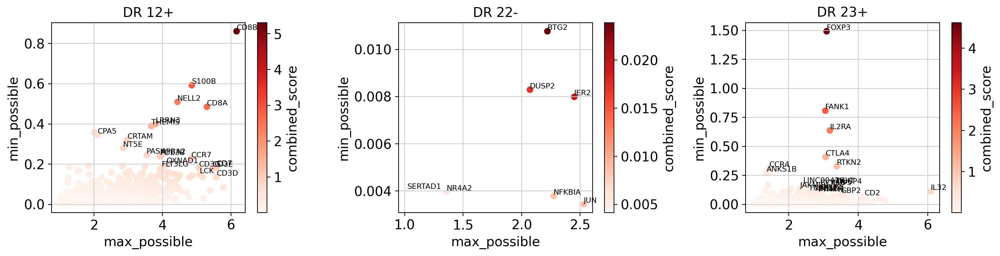

In [32]:
# We visualize 3 dimensions:
# 1. DR 12+ highlighting CD8
# 2. DR 22- highlighting Dissociation stress response
# 3. DR 23+ highlighting T-reg cells
drvi.utils.pl.show_differential_vars_scatter_plot(
    traverse_adata,
    key_x="max_possible",
    key_y="min_possible",
    key_combined="combined_score",
    dim_subset=["DR 12+", "DR 22-", "DR 23+"],
    score_threshold=0.0,
)

DR 12+


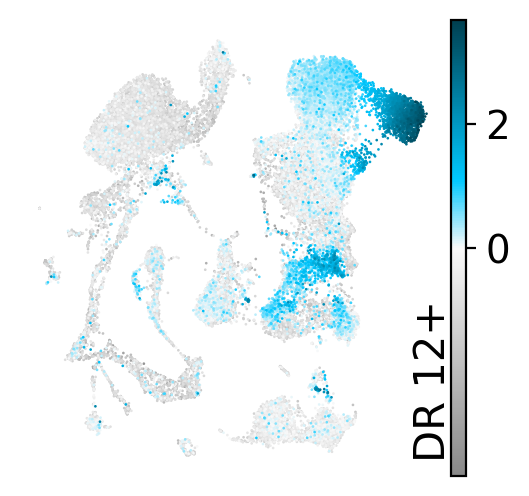

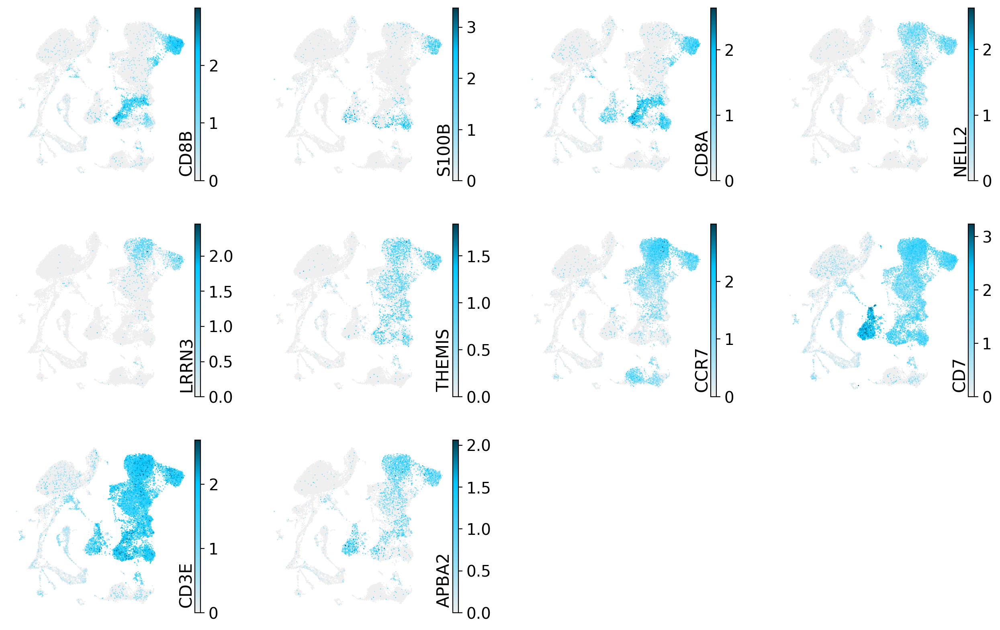

DR 22-


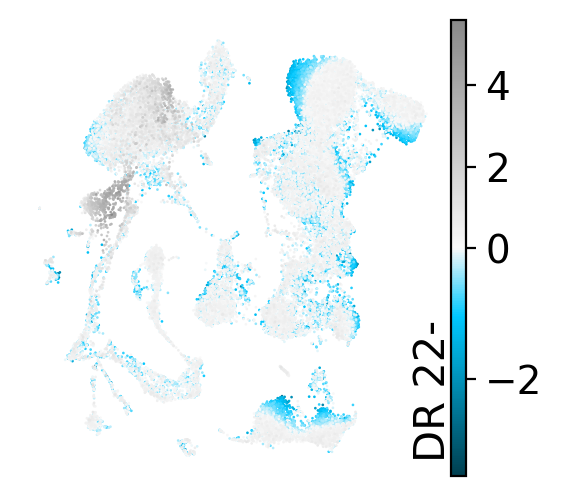

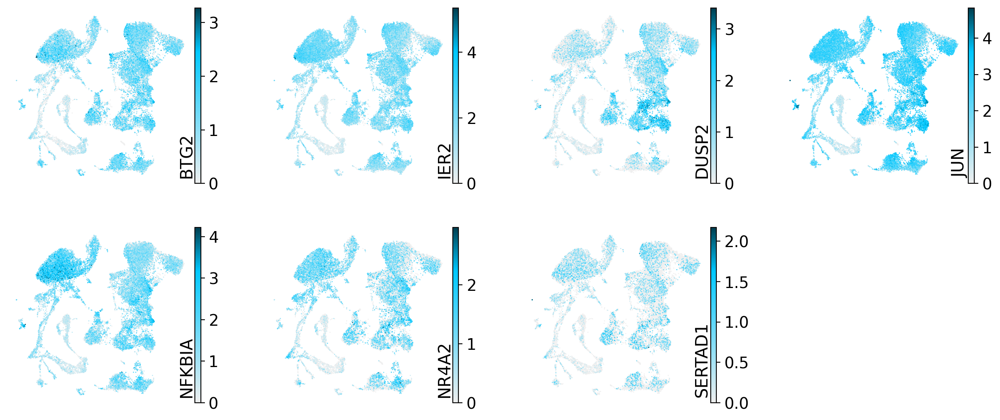

DR 23+


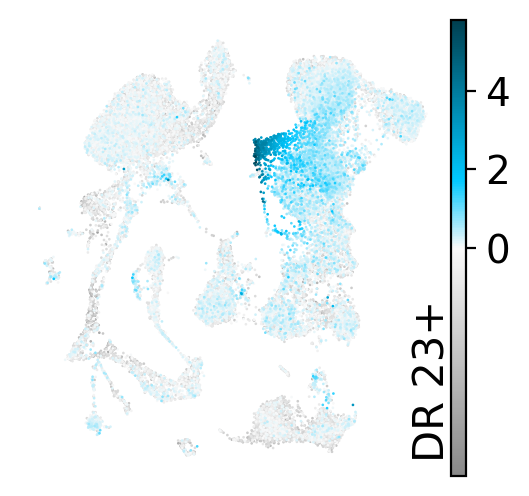

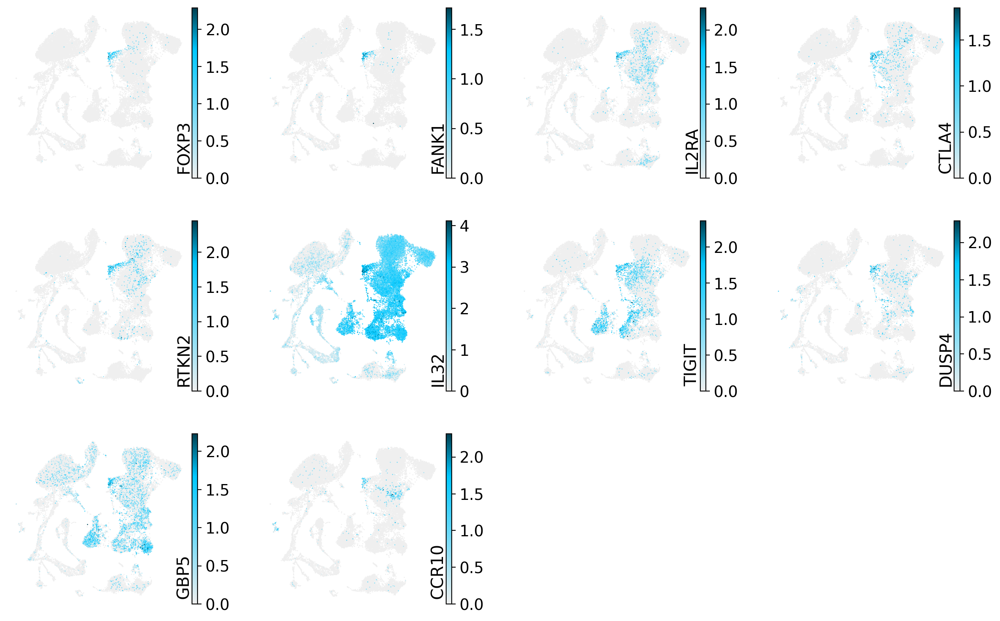

In [33]:
drvi.utils.pl.plot_relevant_genes_on_umap(
    adata,
    embed,
    traverse_adata,
    traverse_adata_key="combined_score",
    dim_subset=["DR 12+", "DR 22-", "DR 23+"],
    score_threshold=0.0,
)